In [1]:
import os

from astropy.io import fits
from matplotlib import pyplot as plt
import numpy as np
from IPython.display import Image

from exotedrf import utils, stage1, stage2
from exotedrf.extra_functions import download_observations

os.chdir(f"{os.environ['HOME']}/Code/ExoTiC-NEAT-training/")
os.environ['CRDS_PATH'] = './crds_cache'
os.environ['CRDS_SERVER_URL'] = 'https://jwst-crds.stsci.edu'

In [2]:
# download_observations(proposal_id='1353', objectname='WASP-17b', instrument_name='NIRISS/SOSS',
#                       filters=['CLEAR', 'F277W'])

In [3]:
def plot_spectrum(path, vmin=1e4, vmax=3e4):
    with fits.open(path) as file:
        plt.figure(figsize=(8, 3))
        plt.imshow(file[1].data[10, -1], aspect='auto', origin='lower',
                   vmin=vmin, vmax=vmax)
        plt.show()
    return path

In [4]:
# Generate output directories
utils.verify_path('/data/typhon2/hattie/jwst/wasp_17/pipeline_outputs_directory')
utils.verify_path('/data/typhon2/hattie/jwst/wasp_17/pipeline_outputs_directory/Stage1')
utils.verify_path('/data/typhon2/hattie/jwst/wasp_17/pipeline_outputs_directory/Stage2')

In [5]:
# First define some input and output directory paths.

uncal_indir = '/data/praxis2/shared_area/jwst/w17/soss/1353_101/stage0/'  # Where our uncalibrated files are found.
outdir_s1 = '/data/typhon2/hattie/jwst/wasp_17/pipeline_outputs_directory/Stage1/'  # Where to save our Stage 1 output files.

In [6]:
observation_id = "jw01353101001"

In [7]:
filenames = [
    f"{uncal_indir}{observation_id}_04101_00001-seg001_nis_uncal.fits",
    f"{uncal_indir}{observation_id}_04101_00001-seg002_nis_uncal.fits",
    f"{uncal_indir}{observation_id}_04101_00001-seg003_nis_uncal.fits",
    f"{uncal_indir}{observation_id}_04101_00001-seg004_nis_uncal.fits",
    f"{uncal_indir}{observation_id}_04101_00001-seg005_nis_uncal.fits",
]


In [8]:
with fits.open(filenames[0]) as file:
    print('No. integrations: {}'.format(file[0].header['NINTS']))
    print('No. groups: {}'.format(file[0].header['NGROUPS']))
    print('subarray: {}'.format(file[0].header['SUBARRAY']))



No. integrations: 720
No. groups: 8
subarray: SUBSTRIP256


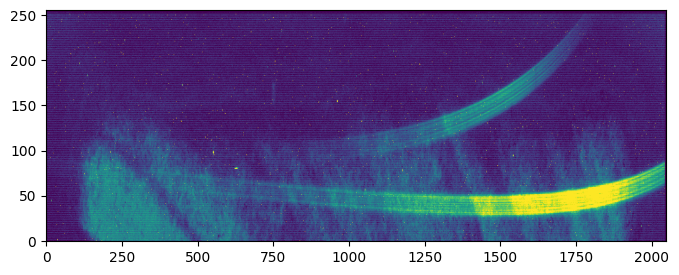

'/data/praxis2/shared_area/jwst/w17/soss/1353_101/stage0/jw01353101001_04101_00001-seg001_nis_uncal.fits'

In [9]:
plot_spectrum(filenames[0])

In [10]:
step = stage1.DQInitStep(filenames, deepframe=None, output_dir=outdir_s1)

# Now run the step!

results = step.run(save_results=True, force_redo=True)

2025-08-20 10:30:48,670 - stpipe.DQInitStep - INFO - DQInitStep instance created.
2025-08-20 10:30:49,516 - CRDS - INFO -  Calibration SW Found: jwst 1.12.5 (/home/bi19158/Code/soss-data-reduction/venv/lib/python3.10/site-packages/jwst-1.12.5.dist-info)
2025-08-20 10:30:50,063 - stpipe.DQInitStep - INFO - DQInitStep instance created.
2025-08-20 10:30:50,225 - stpipe.DQInitStep - INFO - Step DQInitStep running with args (<Level1bModel(178, 8, 256, 2048) from jw01353101001_04101_00001-seg001_nis_uncal.fits>,).
2025-08-20 10:30:50,227 - stpipe.DQInitStep - INFO - Step DQInitStep parameters are:
  pre_hooks: []
  post_hooks: []
  output_file: None
  output_dir: /data/typhon2/hattie/jwst/wasp_17/pipeline_outputs_directory/Stage1/
  output_ext: .fits
  output_use_model: False
  output_use_index: True
  save_results: True
  skip: False
  suffix: None
  search_output_file: True
  input_dir: ''
2025-08-20 10:30:50,656 - stpipe.DQInitStep - INFO - Using MASK reference file ./crds_cache/reference

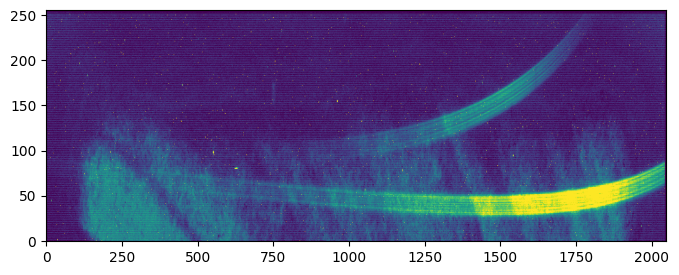

In [11]:
with fits.open(os.path.join(outdir_s1, f"{observation_id}_04101_00001-seg001_nis_dqinitstep.fits")) as file:
    plt.figure(figsize=(8, 3))
    # Let's check out the last group of the 10th integration
    plt.imshow(file[1].data[10, -1], aspect='auto', origin='lower',
               vmin=1e4, vmax=3e4)
    plt.show()

In [12]:

step = stage1.SaturationStep(results, output_dir=outdir_s1)

results = step.run(save_results=True, force_redo=True)

2025-08-20 10:31:26,428 - stpipe.SaturationStep - INFO - SaturationStep instance created.
2025-08-20 10:31:26,448 - stpipe.SaturationStep - INFO - SaturationStep instance created.
2025-08-20 10:31:26,608 - stpipe.SaturationStep - INFO - Step SaturationStep running with args (<RampModel(178, 8, 256, 2048) from jw01353101001_04101_00001-seg001_nis_dqinitstep.fits>,).
2025-08-20 10:31:26,611 - stpipe.SaturationStep - INFO - Step SaturationStep parameters are:
  pre_hooks: []
  post_hooks: []
  output_file: None
  output_dir: /data/typhon2/hattie/jwst/wasp_17/pipeline_outputs_directory/Stage1/
  output_ext: .fits
  output_use_model: False
  output_use_index: True
  save_results: True
  skip: False
  suffix: None
  search_output_file: True
  input_dir: ''
  n_pix_grow_sat: 1
2025-08-20 10:31:26,647 - stpipe.SaturationStep - INFO - Using SATURATION reference file ./crds_cache/references/jwst/niriss/jwst_niriss_saturation_0015.fits
2025-08-20 10:31:26,719 - stpipe.SaturationStep - WARNING - K

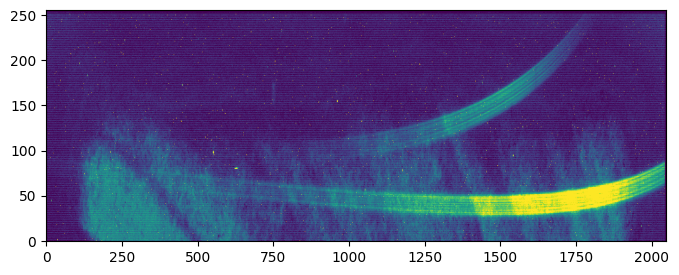

In [13]:
with fits.open(os.path.join(outdir_s1, f"{observation_id}_04101_00001-seg001_nis_saturationstep.fits")) as file:
    plt.figure(figsize=(8, 3))
    # Let's check out the last group of the 10th integration
    plt.imshow(file[1].data[10, -1], aspect='auto', origin='lower',
               vmin=1e4, vmax=3e4)
    plt.show()

In [14]:
saturation_step_files = [
    f"{outdir_s1}{observation_id}_04101_00001-seg001_nis_saturationstep.fits",
    f"{outdir_s1}{observation_id}_04101_00001-seg002_nis_saturationstep.fits",
    f"{outdir_s1}{observation_id}_04101_00001-seg003_nis_saturationstep.fits",
    f"{outdir_s1}{observation_id}_04101_00001-seg004_nis_saturationstep.fits",
    f"{outdir_s1}{observation_id}_04101_00001-seg005_nis_saturationstep.fits",
]

step = stage1.SuperBiasStep(saturation_step_files, output_dir=outdir_s1)

# This step has options for diagnostic plotting. Specifying do_plot=True will create the step
# plot and save it to the output directory.

results = step.run(save_results=True, force_redo=True, do_plot=True)

2025-08-20 10:34:01,386 - stpipe.SuperBiasStep - INFO - SuperBiasStep instance created.
2025-08-20 10:34:01,407 - stpipe.SuperBiasStep - INFO - SuperBiasStep instance created.
2025-08-20 10:34:01,571 - stpipe.SuperBiasStep - INFO - Step SuperBiasStep running with args (<RampModel(178, 8, 256, 2048) from jw01353101001_04101_00001-seg001_nis_saturationstep.fits>,).
2025-08-20 10:34:01,574 - stpipe.SuperBiasStep - INFO - Step SuperBiasStep parameters are:
  pre_hooks: []
  post_hooks: []
  output_file: None
  output_dir: /data/typhon2/hattie/jwst/wasp_17/pipeline_outputs_directory/Stage1/
  output_ext: .fits
  output_use_model: False
  output_use_index: True
  save_results: True
  skip: False
  suffix: None
  search_output_file: True
  input_dir: ''
2025-08-20 10:34:01,610 - stpipe.SuperBiasStep - INFO - Using SUPERBIAS reference file ./crds_cache/references/jwst/niriss/jwst_niriss_superbias_0181.fits
2025-08-20 10:34:03,276 - stpipe.SuperBiasStep - INFO - Results used CRDS context: jwst_

2025-08-20 10:35:55.469 - exoTEDRF - INFO - Doing diagnostic plot.
2025-08-20 10:37:30.573 - exoTEDRF - INFO - Plot saved to /data/typhon2/hattie/jwst/wasp_17/pipeline_outputs_directory/Stage1/superbiasstep.png


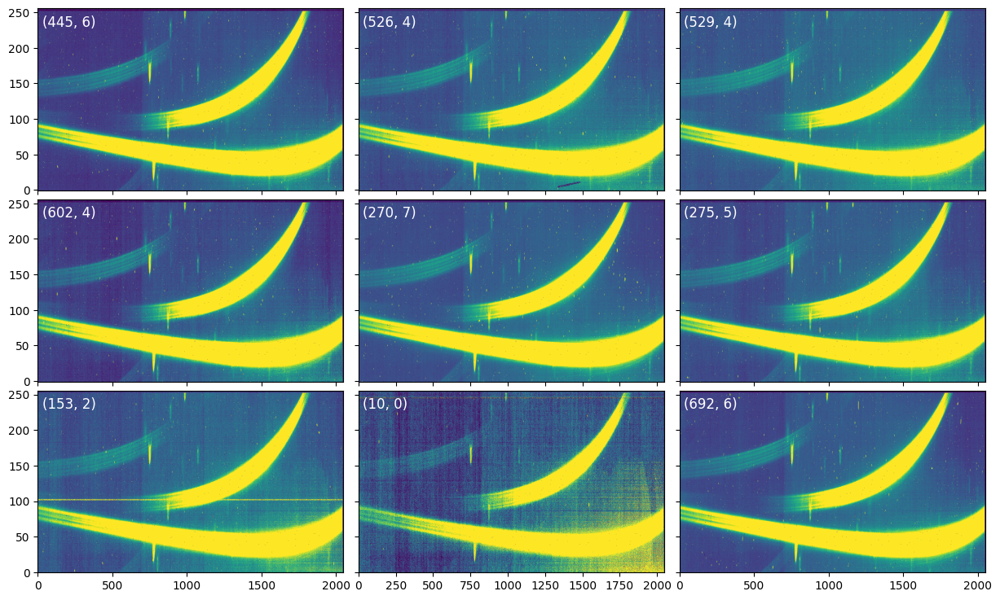

In [15]:
Image(filename=outdir_s1 + 'superbiasstep.png')

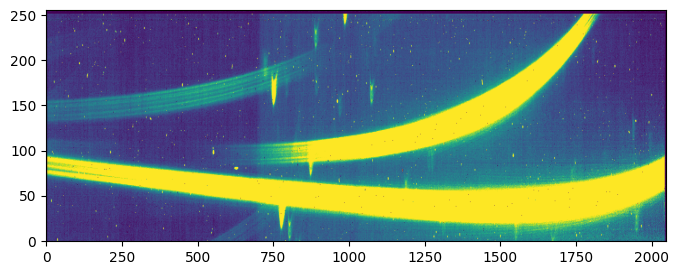

In [16]:
with fits.open(os.path.join(outdir_s1, f"{observation_id}_04101_00001-seg001_nis_superbiasstep.fits")) as file:
    plt.figure(figsize=(8, 3))
    # Let's check out the last group of the 10th integration
    plt.imshow(file[1].data[10, -1], aspect='auto', origin='lower',
               vmin=1e2, vmax=9e2)
    plt.show()

In [17]:
step = stage1.RefPixStep(results, output_dir=outdir_s1)

results = step.run(save_results=True, force_redo=True)

2025-08-20 10:37:31,145 - stpipe.RefPixStep - INFO - RefPixStep instance created.
2025-08-20 10:37:31,167 - stpipe.RefPixStep - INFO - RefPixStep instance created.
2025-08-20 10:37:31,347 - stpipe.RefPixStep - INFO - Step RefPixStep running with args (<RampModel(178, 8, 256, 2048) from jw01353101001_04101_00001-seg001_nis_superbiasstep.fits>,).
2025-08-20 10:37:31,351 - stpipe.RefPixStep - INFO - Step RefPixStep parameters are:
  pre_hooks: []
  post_hooks: []
  output_file: None
  output_dir: /data/typhon2/hattie/jwst/wasp_17/pipeline_outputs_directory/Stage1/
  output_ext: .fits
  output_use_model: False
  output_use_index: True
  save_results: True
  skip: False
  suffix: None
  search_output_file: True
  input_dir: ''
  odd_even_columns: True
  use_side_ref_pixels: True
  side_smoothing_length: 11
  side_gain: 1.0
  odd_even_rows: True
  ovr_corr_mitigation_ftr: 3.0
2025-08-20 10:37:32,288 - stpipe.RefPixStep - INFO - NIR subarray data
2025-08-20 10:37:32,292 - stpipe.RefPixStep - 

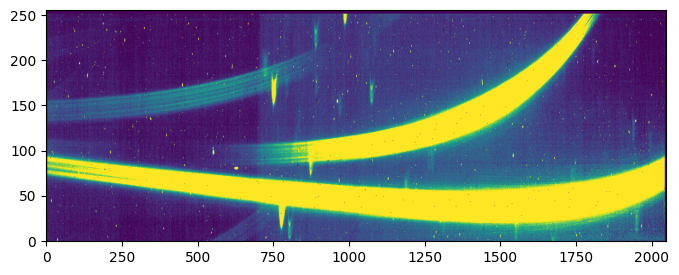

In [18]:
with fits.open(os.path.join(outdir_s1, f"{observation_id}_04101_00001-seg001_nis_refpixstep.fits")) as file:
    plt.figure(figsize=(8, 3))
    # Let's check out the last group of the 10th integration
    plt.imshow(file[1].data[10, -1], aspect='auto', origin='lower',
               vmin=1e2, vmax=9e2)
    plt.show()

In [19]:
step = stage1.DarkCurrentStep(results, output_dir=outdir_s1)

results = step.run(save_results=True, force_redo=True)

2025-08-20 10:38:29,640 - stpipe.DarkCurrentStep - INFO - DarkCurrentStep instance created.
2025-08-20 10:38:29,662 - stpipe.DarkCurrentStep - INFO - DarkCurrentStep instance created.
2025-08-20 10:38:29,828 - stpipe.DarkCurrentStep - INFO - Step DarkCurrentStep running with args (<RampModel(178, 8, 256, 2048) from jw01353101001_04101_00001-seg001_nis_refpixstep.fits>,).
2025-08-20 10:38:29,831 - stpipe.DarkCurrentStep - INFO - Step DarkCurrentStep parameters are:
  pre_hooks: []
  post_hooks: []
  output_file: None
  output_dir: /data/typhon2/hattie/jwst/wasp_17/pipeline_outputs_directory/Stage1/
  output_ext: .fits
  output_use_model: False
  output_use_index: True
  save_results: True
  skip: False
  suffix: None
  search_output_file: True
  input_dir: ''
  dark_output: None
2025-08-20 10:38:29,868 - stpipe.DarkCurrentStep - INFO - Using DARK reference file ./crds_cache/references/jwst/niriss/jwst_niriss_dark_0171.fits
2025-08-20 10:38:29,992 - stpipe.DarkCurrentStep - INFO - Scienc

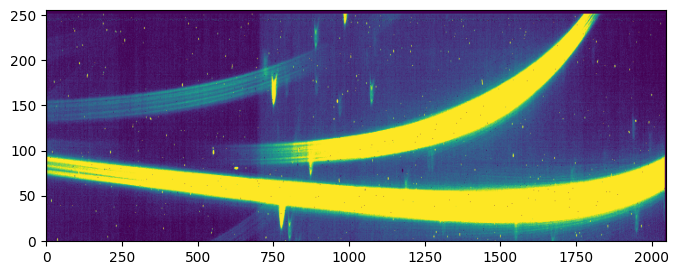

'/data/typhon2/hattie/jwst/wasp_17/pipeline_outputs_directory/Stage1/jw01353101001_04101_00001-seg001_nis_darkcurrentstep.fits'

In [20]:
plot_spectrum(os.path.join(outdir_s1, f"{observation_id}_04101_00001-seg001_nis_darkcurrentstep.fits"), vmin=1e2, vmax=9e2)

In [21]:
background_model = np.load("model_background256.npy")

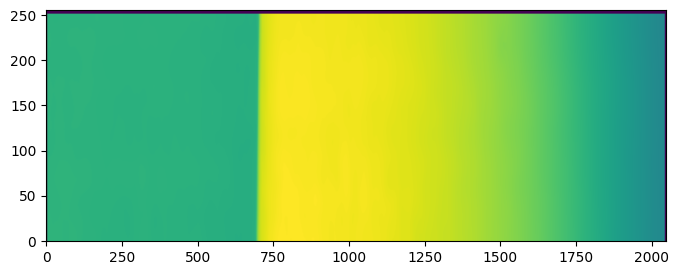

In [22]:
plt.figure(figsize=(8, 3))
plt.imshow(background_model, aspect='auto', origin='lower')
plt.show()

In [23]:
step = stage2.BackgroundStep(results, background_model=background_model,
                             baseline_ints=[150, -100], output_dir=outdir_s1)

results, bkg = step.run(save_results=True, differential=True, force_redo=True, do_plot=True)


2025-08-20 10:39:11.632 - exoTEDRF - INFO - BackgroundStep instance created.
2025-08-20 10:52:34.931 - exoTEDRF - INFO - Starting background subtraction step.
2025-08-20 10:52:44.252 - exoTEDRF - INFO - Generating a median stack using baseline integrations.
2025-08-20 10:54:50.327 - exoTEDRF - INFO - Calculating background model scaling.
2025-08-20 10:54:50.331 - exoTEDRF - INFO - Using differential background scale factors: 0.00516, 0.90620, and shift: 21.45403
2025-08-20 10:54:50.340 - exoTEDRF - INFO - Using differential background scale factors: 0.23138, 2.55849, and shift: 0.00000
2025-08-20 10:54:50.347 - exoTEDRF - INFO - Using differential background scale factors: 4.72524, 7.04988, and shift: 0.00000
2025-08-20 10:54:50.352 - exoTEDRF - INFO - Using differential background scale factors: 9.41369, 11.34619, and shift: 0.00000
2025-08-20 10:54:50.358 - exoTEDRF - INFO - Using differential background scale factors: 14.03268, 15.74005, and shift: 0.00000
2025-08-20 10:54:50.364 - 

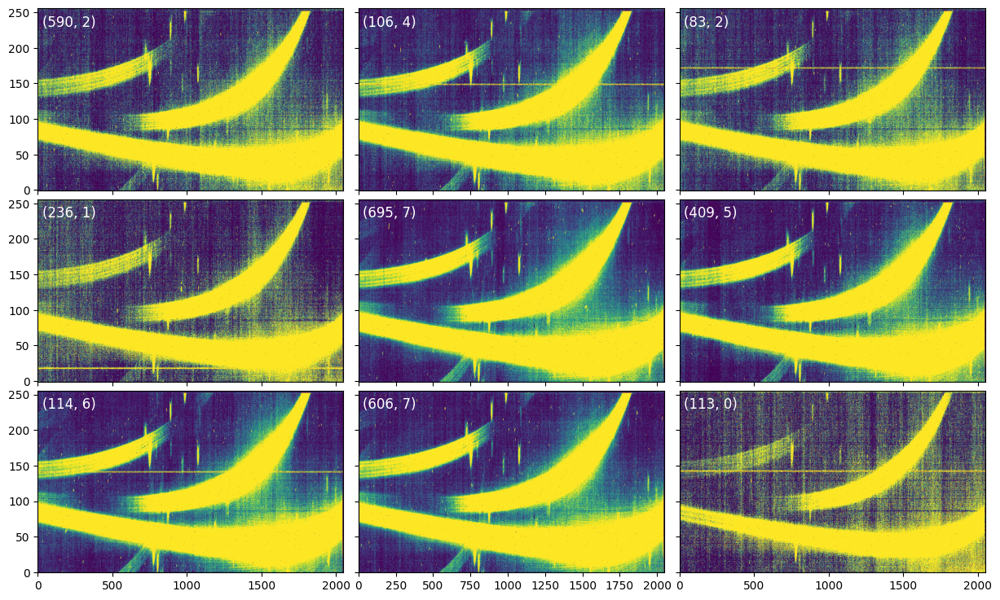

In [24]:
Image(filename=outdir_s1 + 'backgroundstep_1.png')

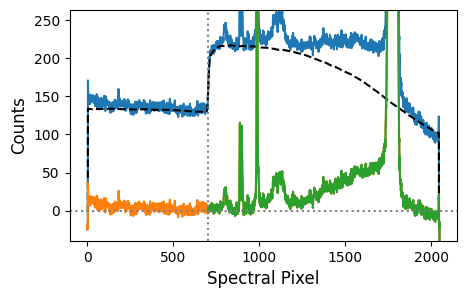

In [25]:
Image(filename=outdir_s1 + 'backgroundstep_2.png')

In [26]:
pixel_masks = None
timeseries = None
step = stage1.OneOverFStep(results, baseline_ints=[150, -100], output_dir=outdir_s1,
                           pixel_masks=pixel_masks, soss_timeseries=timeseries,
                           method='scale-achromatic', soss_background=bkg)
results = step.run(save_results=True, even_odd_rows=True, force_redo=True, do_plot=True,
                   soss_inner_mask_width=40)

2025-08-20 10:57:19.963 - exoTEDRF - INFO - OneOverFStep instance created.
2025-08-20 11:00:43.820 - exoTEDRF - INFO - Starting 1/f correction step using the scale-achromatic method.
2025-08-20 11:00:49.138 - exoTEDRF - INFO - Generating a deep stack for each group using baseline integrations.


2025-08-20 11:02:48,468 - stpipe.Extract1dStep - INFO - Extract1dStep instance created.


2025-08-20 11:02:48.466 - exoTEDRF - INFO - No centroids provided, locating trace positions.
2025-08-20 11:02:49.072 - exoTEDRF - WARNING - No outlier maps passed, ignoring outliers.
2025-08-20 11:02:49.451 - exoTEDRF - INFO - Constructing trace mask.
2025-08-20 11:02:49.854 - exoTEDRF - INFO - Flagging additional outliers.
2025-08-20 11:07:18.702 - exoTEDRF - WARNING - No timeseries passed. It will be estimated from current data.
2025-08-20 11:07:20.330 - exoTEDRF - INFO - Starting full frame correction.


100%|██████████| 720/720 [00:51<00:00, 13.96it/s]


2025-08-20 11:10:11.938 - exoTEDRF - INFO - Doing diagnostic plot 1.
2025-08-20 11:12:16.634 - exoTEDRF - INFO - Plot saved to /data/typhon2/hattie/jwst/wasp_17/pipeline_outputs_directory/Stage1/oneoverfstep_1.png
2025-08-20 11:12:16.661 - exoTEDRF - INFO - Doing diagnostic plot 2.


100%|██████████| 25/25 [01:58<00:00,  4.75s/it]


2025-08-20 11:19:13.231 - exoTEDRF - INFO - Plot saved to /data/typhon2/hattie/jwst/wasp_17/pipeline_outputs_directory/Stage1/oneoverfstep_2.png
2025-08-20 11:19:13.232 - exoTEDRF - INFO - Step OneOverFStep done.


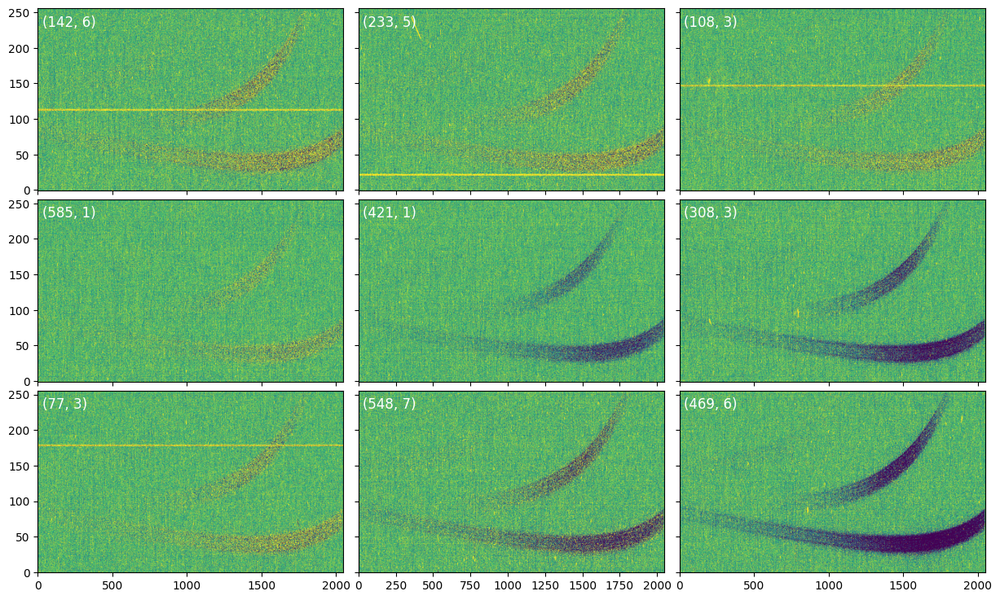

In [27]:
Image(filename=outdir_s1 + 'oneoverfstep_1.png')



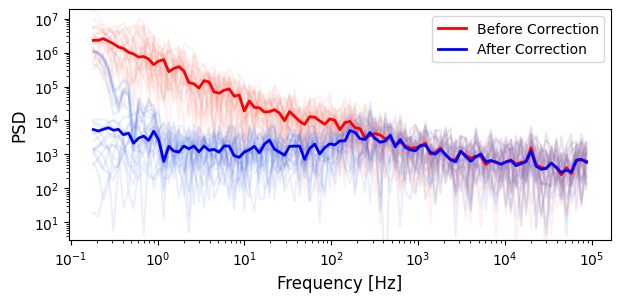

In [28]:
Image(filename=outdir_s1 + 'oneoverfstep_2.png')


In [29]:
step = stage1.LinearityStep(results, output_dir=outdir_s1)

results = step.run(save_results=True, force_redo=True, do_plot=True)

2025-08-20 11:19:14,210 - stpipe.LinearityStep - INFO - LinearityStep instance created.
2025-08-20 11:19:14,230 - stpipe.LinearityStep - INFO - LinearityStep instance created.
2025-08-20 11:19:14,587 - stpipe.LinearityStep - INFO - Step LinearityStep running with args (<RampModel(178, 8, 256, 2048) from jw01353101001_04101_00001-seg001_nis_oneoverfstep.fits>,).
2025-08-20 11:19:14,589 - stpipe.LinearityStep - INFO - Step LinearityStep parameters are:
  pre_hooks: []
  post_hooks: []
  output_file: None
  output_dir: /data/typhon2/hattie/jwst/wasp_17/pipeline_outputs_directory/Stage1/
  output_ext: .fits
  output_use_model: False
  output_use_index: True
  save_results: True
  skip: False
  suffix: None
  search_output_file: True
  input_dir: ''
2025-08-20 11:19:14,625 - stpipe.LinearityStep - INFO - Using Linearity reference file ./crds_cache/references/jwst/niriss/jwst_niriss_linearity_0017.fits
2025-08-20 11:19:14,731 - stpipe.LinearityStep - WARNING - Keyword LOWILLUM does not corre

2025-08-20 11:19:29,662 - stpipe.LinearityStep - INFO - Saved model in /data/typhon2/hattie/jwst/wasp_17/pipeline_outputs_directory/Stage1/jw01353101001_04101_00001-seg001_nis_oneoverfstep_linearitystep.fits
2025-08-20 11:19:29,664 - stpipe.LinearityStep - INFO - Step LinearityStep done
2025-08-20 11:19:55,223 - stpipe.LinearityStep - INFO - LinearityStep instance created.
2025-08-20 11:19:55,244 - stpipe.LinearityStep - INFO - LinearityStep instance created.
2025-08-20 11:19:55,409 - stpipe.LinearityStep - INFO - Step LinearityStep running with args (<RampModel(178, 8, 256, 2048) from jw01353101001_04101_00001-seg002_nis_oneoverfstep.fits>,).
2025-08-20 11:19:55,411 - stpipe.LinearityStep - INFO - Step LinearityStep parameters are:
  pre_hooks: []
  post_hooks: []
  output_file: None
  output_dir: /data/typhon2/hattie/jwst/wasp_17/pipeline_outputs_directory/Stage1/
  output_ext: .fits
  output_use_model: False
  output_use_index: True
  save_results: True
  skip: False
  suffix: None


2025-08-20 11:22:16.986 - exoTEDRF - INFO - Doing diagnostic plot 1.
2025-08-20 11:22:29.545 - exoTEDRF - INFO - Plot saved to /data/typhon2/hattie/jwst/wasp_17/pipeline_outputs_directory/Stage1/linearitystep_1.png
2025-08-20 11:22:29.590 - exoTEDRF - INFO - Doing diagnostic plot 2.
2025-08-20 11:23:24.487 - exoTEDRF - INFO - Plot saved to /data/typhon2/hattie/jwst/wasp_17/pipeline_outputs_directory/Stage1/linearitystep_2.png


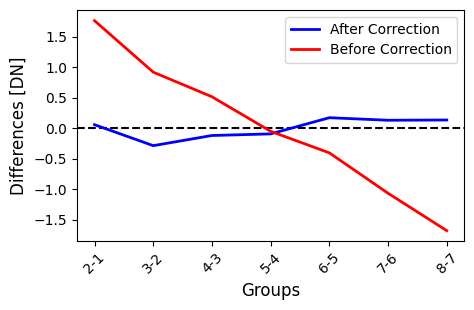

In [30]:
Image(filename=outdir_s1 + 'linearitystep_1.png')



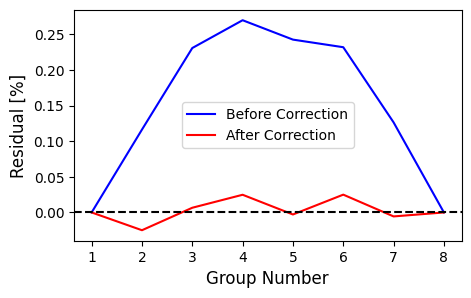

In [31]:
Image(filename=outdir_s1 + 'linearitystep_2.png')



In [32]:
linearity_step_files = [
    f"{outdir_s1}{observation_id}_04101_00001-seg001_nis_linearitystep.fits",
    f"{outdir_s1}{observation_id}_04101_00001-seg002_nis_linearitystep.fits",
    f"{outdir_s1}{observation_id}_04101_00001-seg003_nis_linearitystep.fits",
    f"{outdir_s1}{observation_id}_04101_00001-seg004_nis_linearitystep.fits",
    f"{outdir_s1}{observation_id}_04101_00001-seg005_nis_linearitystep.fits",
]

step = stage1.JumpStep(linearity_step_files, output_dir=outdir_s1)
results = step.run(save_results=True, force_redo=True, flag_in_time=True,
                   time_rejection_threshold=7, do_plot=True)

2025-08-20 11:23:32.424 - exoTEDRF - INFO - Starting time-domain jump detection step.


  0%|          | 0/8 [00:00<?, ?it/s]

100%|██████████| 8/8 [23:47<00:00, 178.38s/it]


2025-08-20 11:47:19.562 - exoTEDRF - INFO - 851410 jumps flagged
2025-08-20 11:47:19.562 - exoTEDRF - INFO - and 0 interpolated
2025-08-20 11:47:34.004 - exoTEDRF - INFO - Done
2025-08-20 11:47:34.027 - exoTEDRF - INFO - Starting time-domain jump detection step.


100%|██████████| 8/8 [23:01<00:00, 172.68s/it]


2025-08-20 12:10:35.605 - exoTEDRF - INFO - 872973 jumps flagged
2025-08-20 12:10:35.605 - exoTEDRF - INFO - and 0 interpolated
2025-08-20 12:10:41.642 - exoTEDRF - INFO - Done
2025-08-20 12:10:41.665 - exoTEDRF - INFO - Starting time-domain jump detection step.


100%|██████████| 8/8 [22:55<00:00, 171.90s/it]


2025-08-20 12:33:37.014 - exoTEDRF - INFO - 836003 jumps flagged
2025-08-20 12:33:37.014 - exoTEDRF - INFO - and 0 interpolated
2025-08-20 12:33:42.929 - exoTEDRF - INFO - Done
2025-08-20 12:33:42.952 - exoTEDRF - INFO - Starting time-domain jump detection step.


100%|██████████| 8/8 [23:22<00:00, 175.33s/it]


2025-08-20 12:57:05.679 - exoTEDRF - INFO - 835630 jumps flagged
2025-08-20 12:57:05.679 - exoTEDRF - INFO - and 0 interpolated
2025-08-20 12:57:11.801 - exoTEDRF - INFO - Done
2025-08-20 12:57:11.824 - exoTEDRF - INFO - Starting time-domain jump detection step.


100%|██████████| 8/8 [00:48<00:00,  6.05s/it]


2025-08-20 12:58:00.259 - exoTEDRF - INFO - 110555 jumps flagged
2025-08-20 12:58:00.259 - exoTEDRF - INFO - and 0 interpolated
2025-08-20 12:58:00.658 - exoTEDRF - INFO - Done
2025-08-20 12:58:00.658 - exoTEDRF - INFO - Doing diagnostic plot.
2025-08-20 12:59:28.799 - exoTEDRF - INFO - Plot saved to /data/typhon2/hattie/jwst/wasp_17/pipeline_outputs_directory/Stage1/jump.png
2025-08-20 12:59:28.851 - exoTEDRF - INFO - Step JumpStep done.


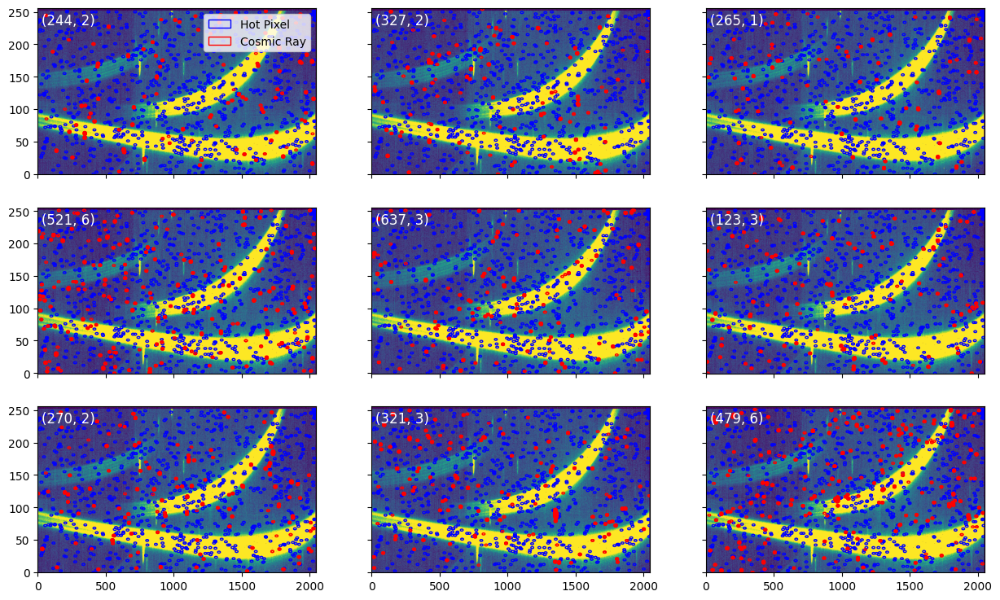

In [33]:
Image(filename=outdir_s1 + 'jump.png')

In [34]:
step = stage1.RampFitStep(results, output_dir=outdir_s1)

results = step.run(save_results=True, force_redo=True)

2025-08-20 12:59:30,165 - stpipe.RampFitStep - INFO - RampFitStep instance created.
2025-08-20 12:59:30,253 - stpipe.RampFitStep - INFO - RampFitStep instance created.
2025-08-20 12:59:33,233 - stpipe.RampFitStep - INFO - Step RampFitStep running with args (<RampModel(178, 8, 256, 2048) from jw01353101001_04101_00001-seg001_nis_jump.fits>,).
2025-08-20 12:59:33,238 - stpipe.RampFitStep - INFO - Step RampFitStep parameters are:
  pre_hooks: []
  post_hooks: []
  output_file: None
  output_dir: /data/typhon2/hattie/jwst/wasp_17/pipeline_outputs_directory/Stage1/
  output_ext: .fits
  output_use_model: False
  output_use_index: True
  save_results: True
  skip: False
  suffix: None
  search_output_file: True
  input_dir: ''
  int_name: ''
  save_opt: False
  opt_name: ''
  suppress_one_group: True
  maximum_cores: quarter
2025-08-20 12:59:33,314 - stpipe.RampFitStep - INFO - Using READNOISE reference file: ./crds_cache/references/jwst/niriss/jwst_niriss_readnoise_0005.fits
2025-08-20 12:5

2025-08-20 13:00:24.158 - exoTEDRF - INFO - Doing cosmetic NaN interpolation.


2025-08-20 13:01:56,848 - stpipe.RampFitStep - INFO - RampFitStep instance created.
2025-08-20 13:01:56,870 - stpipe.RampFitStep - INFO - RampFitStep instance created.
2025-08-20 13:01:57,067 - stpipe.RampFitStep - INFO - Step RampFitStep running with args (<RampModel(178, 8, 256, 2048) from jw01353101001_04101_00001-seg002_nis_jump.fits>,).
2025-08-20 13:01:57,070 - stpipe.RampFitStep - INFO - Step RampFitStep parameters are:
  pre_hooks: []
  post_hooks: []
  output_file: None
  output_dir: /data/typhon2/hattie/jwst/wasp_17/pipeline_outputs_directory/Stage1/
  output_ext: .fits
  output_use_model: False
  output_use_index: True
  save_results: True
  skip: False
  suffix: None
  search_output_file: True
  input_dir: ''
  int_name: ''
  save_opt: False
  opt_name: ''
  suppress_one_group: True
  maximum_cores: quarter
2025-08-20 13:01:57,125 - stpipe.RampFitStep - INFO - Using READNOISE reference file: ./crds_cache/references/jwst/niriss/jwst_niriss_readnoise_0005.fits
2025-08-20 13:0

2025-08-20 13:02:54.765 - exoTEDRF - INFO - Doing cosmetic NaN interpolation.


2025-08-20 13:04:27,736 - stpipe.RampFitStep - INFO - RampFitStep instance created.
2025-08-20 13:04:27,758 - stpipe.RampFitStep - INFO - RampFitStep instance created.
2025-08-20 13:04:27,961 - stpipe.RampFitStep - INFO - Step RampFitStep running with args (<RampModel(178, 8, 256, 2048) from jw01353101001_04101_00001-seg003_nis_jump.fits>,).
2025-08-20 13:04:27,965 - stpipe.RampFitStep - INFO - Step RampFitStep parameters are:
  pre_hooks: []
  post_hooks: []
  output_file: None
  output_dir: /data/typhon2/hattie/jwst/wasp_17/pipeline_outputs_directory/Stage1/
  output_ext: .fits
  output_use_model: False
  output_use_index: True
  save_results: True
  skip: False
  suffix: None
  search_output_file: True
  input_dir: ''
  int_name: ''
  save_opt: False
  opt_name: ''
  suppress_one_group: True
  maximum_cores: quarter
2025-08-20 13:04:28,020 - stpipe.RampFitStep - INFO - Using READNOISE reference file: ./crds_cache/references/jwst/niriss/jwst_niriss_readnoise_0005.fits
2025-08-20 13:0

2025-08-20 13:05:24.564 - exoTEDRF - INFO - Doing cosmetic NaN interpolation.


2025-08-20 13:06:57,404 - stpipe.RampFitStep - INFO - RampFitStep instance created.
2025-08-20 13:06:57,425 - stpipe.RampFitStep - INFO - RampFitStep instance created.
2025-08-20 13:06:57,629 - stpipe.RampFitStep - INFO - Step RampFitStep running with args (<RampModel(178, 8, 256, 2048) from jw01353101001_04101_00001-seg004_nis_jump.fits>,).
2025-08-20 13:06:57,633 - stpipe.RampFitStep - INFO - Step RampFitStep parameters are:
  pre_hooks: []
  post_hooks: []
  output_file: None
  output_dir: /data/typhon2/hattie/jwst/wasp_17/pipeline_outputs_directory/Stage1/
  output_ext: .fits
  output_use_model: False
  output_use_index: True
  save_results: True
  skip: False
  suffix: None
  search_output_file: True
  input_dir: ''
  int_name: ''
  save_opt: False
  opt_name: ''
  suppress_one_group: True
  maximum_cores: quarter
2025-08-20 13:06:57,688 - stpipe.RampFitStep - INFO - Using READNOISE reference file: ./crds_cache/references/jwst/niriss/jwst_niriss_readnoise_0005.fits
2025-08-20 13:0

2025-08-20 13:07:50.553 - exoTEDRF - INFO - Doing cosmetic NaN interpolation.


2025-08-20 13:09:23,094 - stpipe.RampFitStep - INFO - RampFitStep instance created.
2025-08-20 13:09:23,116 - stpipe.RampFitStep - INFO - RampFitStep instance created.
2025-08-20 13:09:23,321 - stpipe.RampFitStep - INFO - Step RampFitStep running with args (<RampModel(8, 8, 256, 2048) from jw01353101001_04101_00001-seg005_nis_jump.fits>,).
2025-08-20 13:09:23,324 - stpipe.RampFitStep - INFO - Step RampFitStep parameters are:
  pre_hooks: []
  post_hooks: []
  output_file: None
  output_dir: /data/typhon2/hattie/jwst/wasp_17/pipeline_outputs_directory/Stage1/
  output_ext: .fits
  output_use_model: False
  output_use_index: True
  save_results: True
  skip: False
  suffix: None
  search_output_file: True
  input_dir: ''
  int_name: ''
  save_opt: False
  opt_name: ''
  suppress_one_group: True
  maximum_cores: quarter
2025-08-20 13:09:23,380 - stpipe.RampFitStep - INFO - Using READNOISE reference file: ./crds_cache/references/jwst/niriss/jwst_niriss_readnoise_0005.fits
2025-08-20 13:09:

2025-08-20 13:09:28.187 - exoTEDRF - INFO - Doing cosmetic NaN interpolation.
2025-08-20 13:09:32.553 - exoTEDRF - INFO - Step RampFitStep really done.


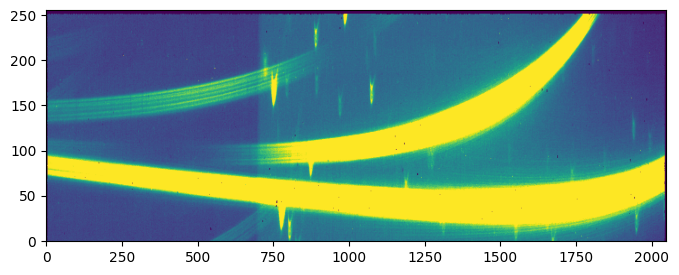

In [35]:
with fits.open(os.path.join(outdir_s1, f"{observation_id}_04101_00001-seg003_nis_rampfitstep.fits")) as file:
    plt.figure(figsize=(8, 3))
    plt.imshow(file[1].data[0], aspect='auto', origin='lower', vmin=1, vmax=16)
    plt.show()

In [36]:
step = stage1.GainScaleStep(results, output_dir=outdir_s1)

results = step.run(save_results=True, force_redo=True)



2025-08-20 13:09:33,674 - stpipe.GainScaleStep - INFO - GainScaleStep instance created.
2025-08-20 13:09:33,692 - stpipe.GainScaleStep - INFO - GainScaleStep instance created.
2025-08-20 13:09:33,901 - stpipe.GainScaleStep - INFO - Step GainScaleStep running with args (<CubeModel(178, 256, 2048) from jw01353101001_04101_00001-seg001_nis_rampfitstep.fits>,).
2025-08-20 13:09:33,904 - stpipe.GainScaleStep - INFO - Step GainScaleStep parameters are:
  pre_hooks: []
  post_hooks: []
  output_file: None
  output_dir: /data/typhon2/hattie/jwst/wasp_17/pipeline_outputs_directory/Stage1/
  output_ext: .fits
  output_use_model: False
  output_use_index: True
  save_results: True
  skip: False
  suffix: None
  search_output_file: True
  input_dir: ''
2025-08-20 13:09:33,986 - stpipe.GainScaleStep - INFO - GAINFACT not found in gain reference file
2025-08-20 13:09:33,987 - stpipe.GainScaleStep - INFO - Step will be skipped
2025-08-20 13:09:33,998 - stpipe.GainScaleStep - INFO - Results used CRDS 

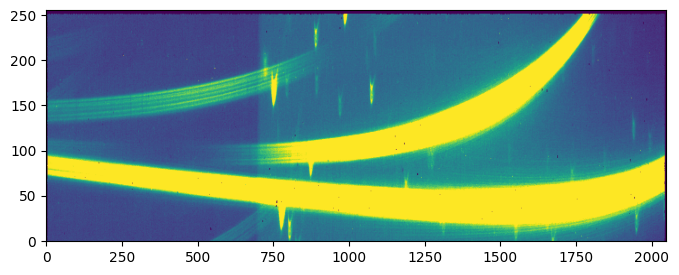

In [37]:
with fits.open(os.path.join(outdir_s1, f"{observation_id}_04101_00001-seg003_nis_gainscalestep.fits")) as file:
    plt.figure(figsize=(8, 3))
    plt.imshow(file[1].data[0], aspect='auto', origin='lower', vmin=1, vmax=16)
    plt.show()